# Load Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
msn37= pd.read_csv('msn_37_fuel_leak_signals_preprocessed.csv', sep=";")

### Summary of MSN  11

In [4]:
msn37.head()

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,MSN
0,2016-07-27 13:31:37,NaN,NaN,NaN,36.0,19862.0,0.0,1928.0,2710.0,2560.0,1921.0,5405.0,5339.0,2.0,NaN,0.0,F-RBAJ
1,2016-07-27 13:31:38,NaN,NaN,NaN,38.0,19862.0,0.0,1928.0,2710.0,2560.0,1921.0,5405.0,5339.0,2.0,NaN,0.0,F-RBAJ
2,2016-07-27 13:31:39,NaN,NaN,NaN,38.0,19862.0,0.0,1928.0,2710.0,2561.0,1921.0,5406.0,5338.0,2.0,NaN,0.0,F-RBAJ
3,2016-07-27 13:31:40,NaN,NaN,NaN,35.0,19862.0,0.0,1928.0,2709.0,2561.0,1921.0,5405.0,5339.0,2.0,NaN,0.0,F-RBAJ
4,2016-07-27 13:31:41,NaN,NaN,NaN,36.0,19862.0,0.0,1928.0,2710.0,2561.0,1922.0,5405.0,5339.0,2.0,NaN,0.0,F-RBAJ


In [5]:
data1 = {}
data1['Features'] = list(msn37.columns)
data1['msn02'] = list(msn37.isnull().sum())
data1['msn02_%'] = [round(x/msn37.shape[0]*100, 2) for x in list(msn37.isnull().sum())]
data1['n_unique'] = list(msn37.nunique())

df = pd.DataFrame(data1)
df

,Features,msn02,msn02_%,n_unique
0,UTC_TIME,0,0.00,3236645
1,FUEL_USED_2,2919211,90.19,214755
2,FUEL_USED_3,2919569,90.20,200718
3,FUEL_USED_4,2919530,90.20,176854
4,FW_GEO_ALTITUDE,73299,2.26,35627
5,VALUE_FOB,73129,2.26,43025
6,VALUE_FUEL_QTY_CT,73129,2.26,10226
7,VALUE_FUEL_QTY_FT1,73129,2.26,1531
8,VALUE_FUEL_QTY_FT2,73129,2.26,1846
9,VALUE_FUEL_QTY_FT3,73129,2.26,1695


### Working with its Columns

In [9]:
# Convert 'UTC_TIME' to datetime
msn37['UTC_TIME'] = pd.to_datetime(msn37['UTC_TIME'])

# Create new columns for date and time
msn37['DATE'] = msn37['UTC_TIME'].dt.date
msn37['TIME'] = msn37['UTC_TIME'].dt.time

# Display the DataFrame to verify the changes
print(msn37[['UTC_TIME', 'DATE', 'TIME']].head())

             UTC_TIME        DATE      TIME
0 2016-07-27 13:31:37  2016-07-27  13:31:37
1 2016-07-27 13:31:38  2016-07-27  13:31:38
2 2016-07-27 13:31:39  2016-07-27  13:31:39
3 2016-07-27 13:31:40  2016-07-27  13:31:40
4 2016-07-27 13:31:41  2016-07-27  13:31:41


In [10]:
# Filter msn02 dataset for rows where FLIGHT_PHASE_COUNT == 8
msn37 = msn37[msn37['FLIGHT_PHASE_COUNT'] == 8]

# Display the filtered DataFrame to verify the changes
msn37.head()

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,MSN,DATE,TIME
680,2016-07-27 13:42:57,NaN,NaN,NaN,1504.0,18508.0,0.0,1823.0,2097.0,2406.0,1527.0,5314.0,5343.0,8.0,NaN,0.0,F-RBAJ,2016-07-27,13:42:57
681,2016-07-27 13:42:58,NaN,NaN,NaN,1547.0,18498.0,0.0,1821.0,2091.0,2409.0,1527.0,5312.0,5339.0,8.0,NaN,0.0,F-RBAJ,2016-07-27,13:42:58
682,2016-07-27 13:42:59,NaN,NaN,NaN,1586.0,18488.0,0.0,1820.0,2085.0,2411.0,1527.0,5308.0,5338.0,8.0,NaN,0.0,F-RBAJ,2016-07-27,13:42:59
683,2016-07-27 13:43:00,NaN,NaN,NaN,1630.0,18481.0,0.0,1820.0,2082.0,2411.0,1530.0,5305.0,5336.0,8.0,NaN,0.0,F-RBAJ,2016-07-27,13:43:00
684,2016-07-27 13:43:01,NaN,NaN,NaN,1673.0,18472.0,0.0,1820.0,2078.0,2411.0,1533.0,5299.0,5334.0,8.0,NaN,0.0,F-RBAJ,2016-07-27,13:43:01


In [11]:
# Check if there are any duplicates in the UTC_TIME column
has_duplicates = msn37.duplicated(['UTC_TIME']).any()

# Print the result
print("Are there any duplicates in the UTC_TIME column?", has_duplicates)

Are there any duplicates in the UTC_TIME column? False


### Creating FUEL_USED_TOTAL COLUMN

In [12]:
msn37['FUEL_USED_TOTAL'] = msn37['FUEL_USED_1'] + msn37['FUEL_USED_2'] + msn37['FUEL_USED_3'] + msn37['FUEL_USED_4']

In [13]:
msn37['VALUE_FOB'].isna().sum()

0

### Creating a graph for VALUE_FOB in MSN 11

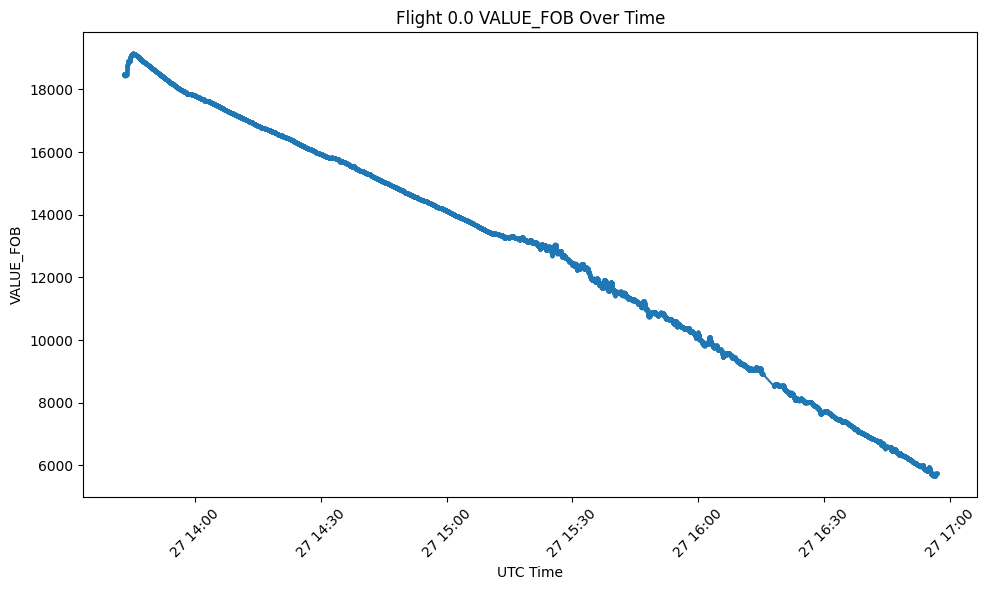

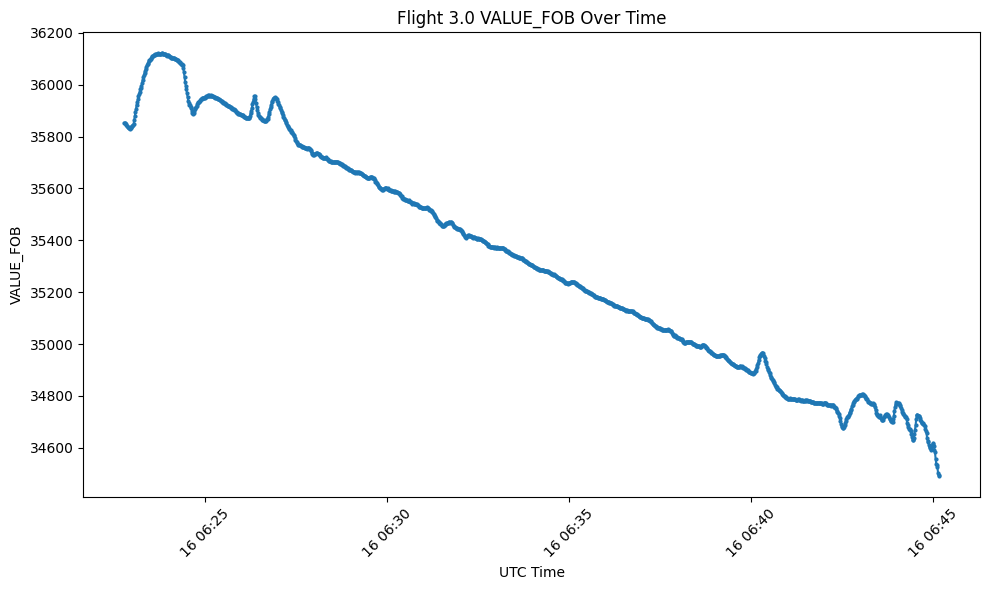

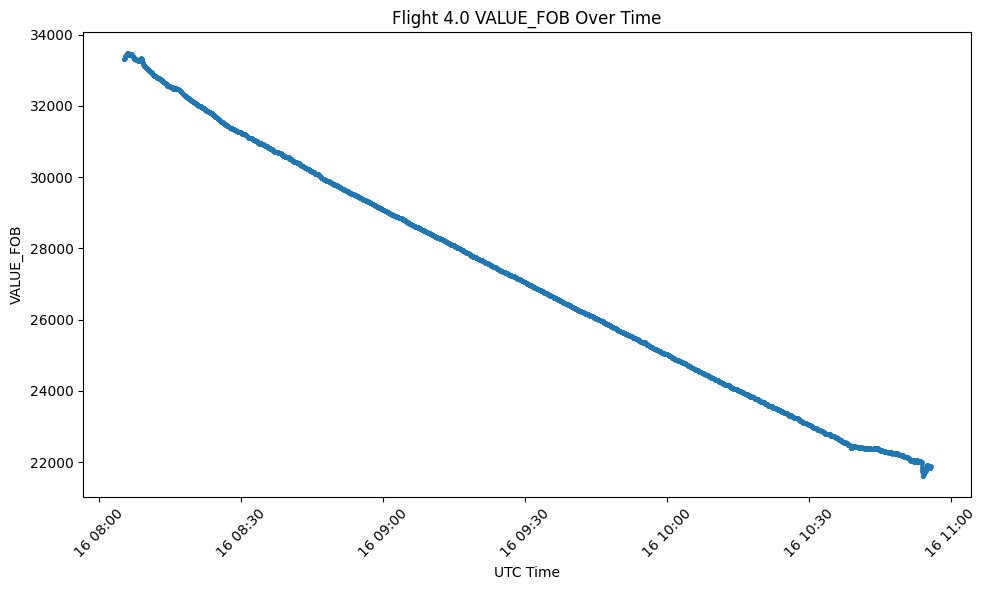

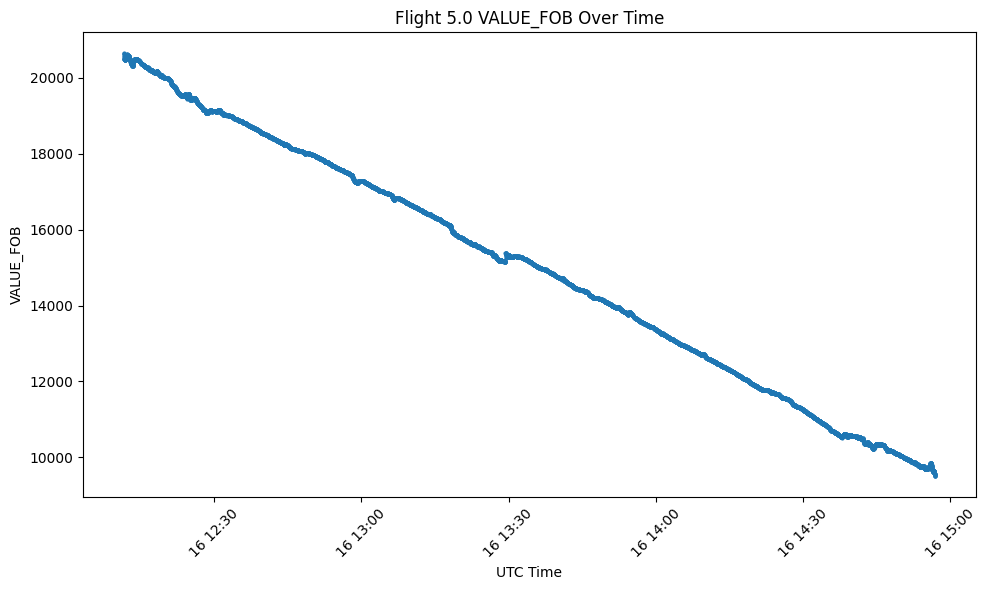

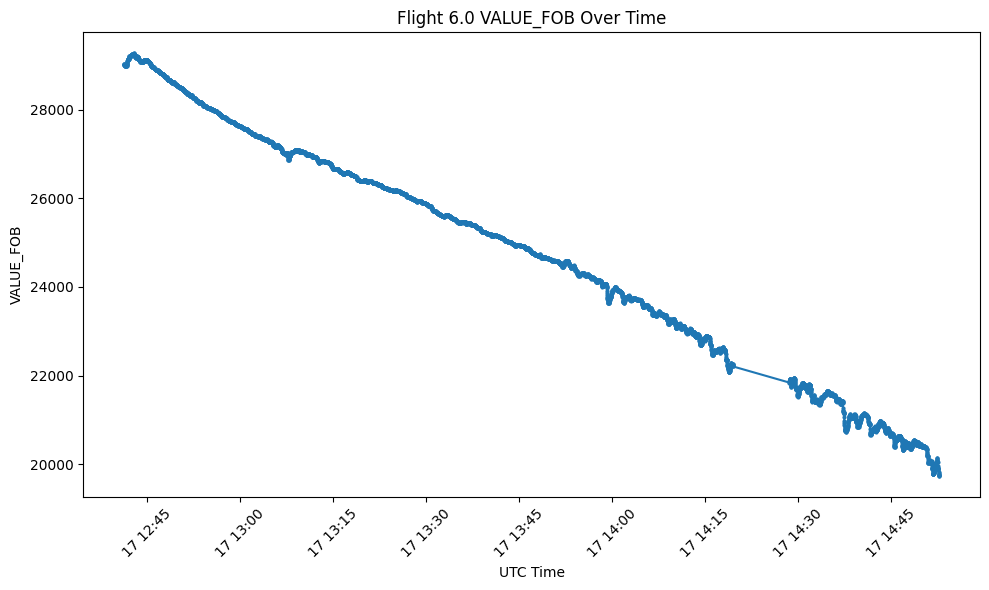

...

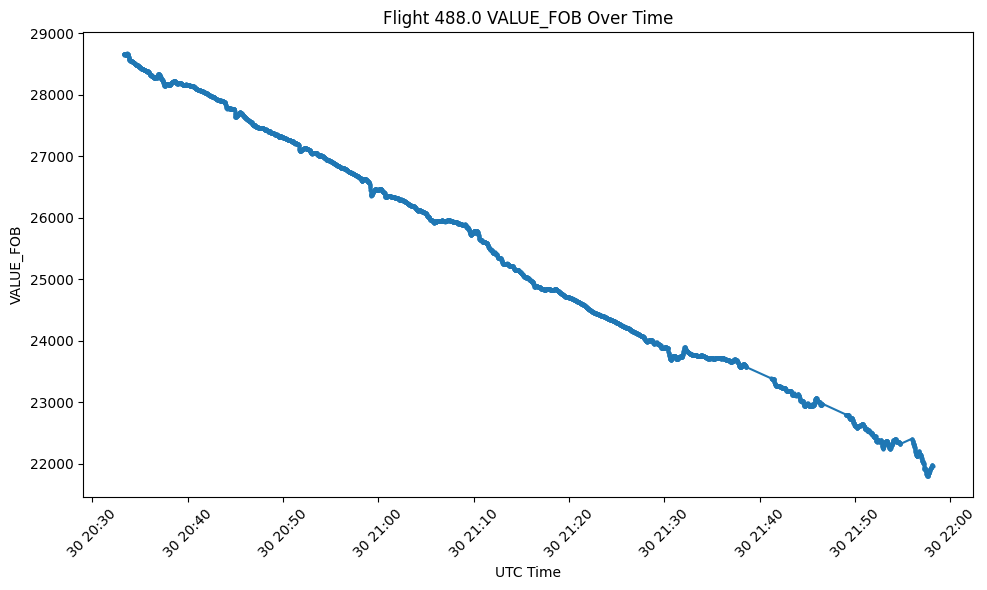

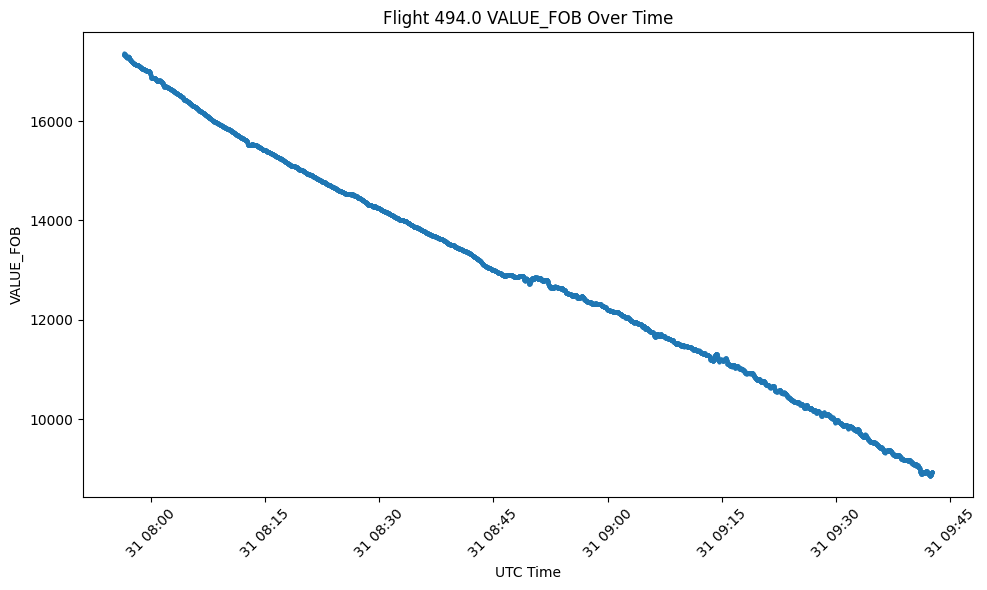

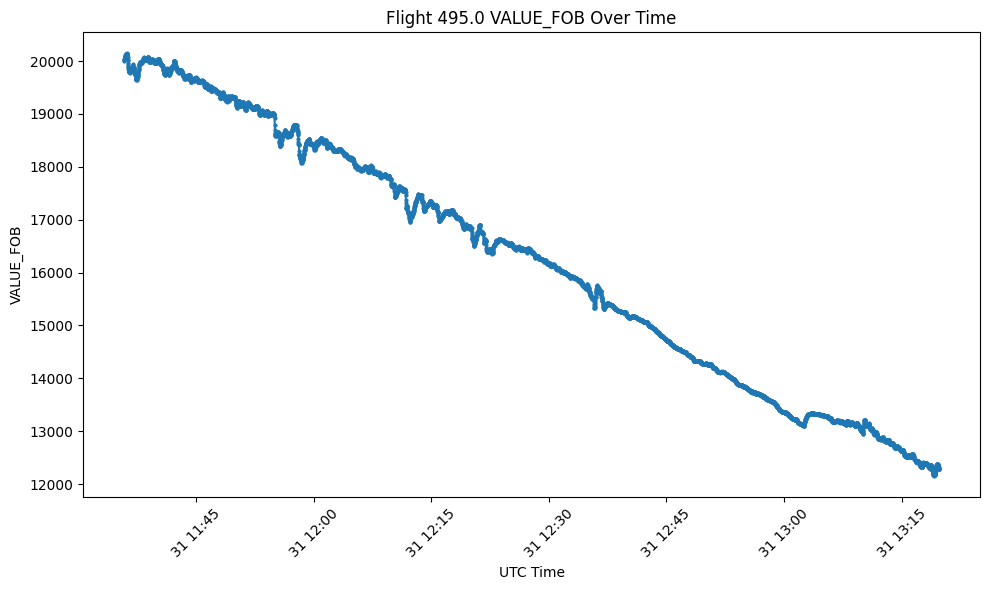

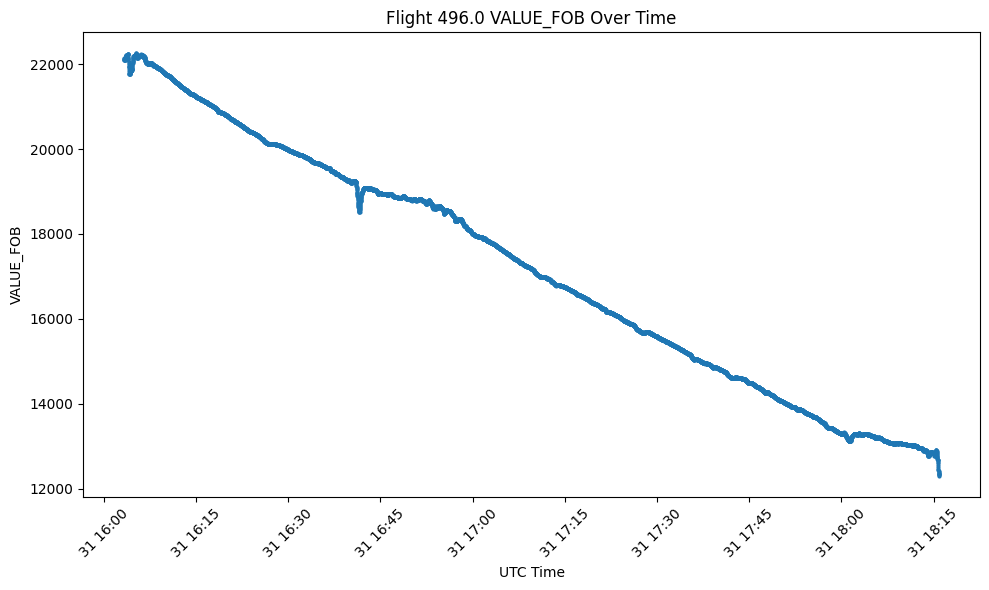

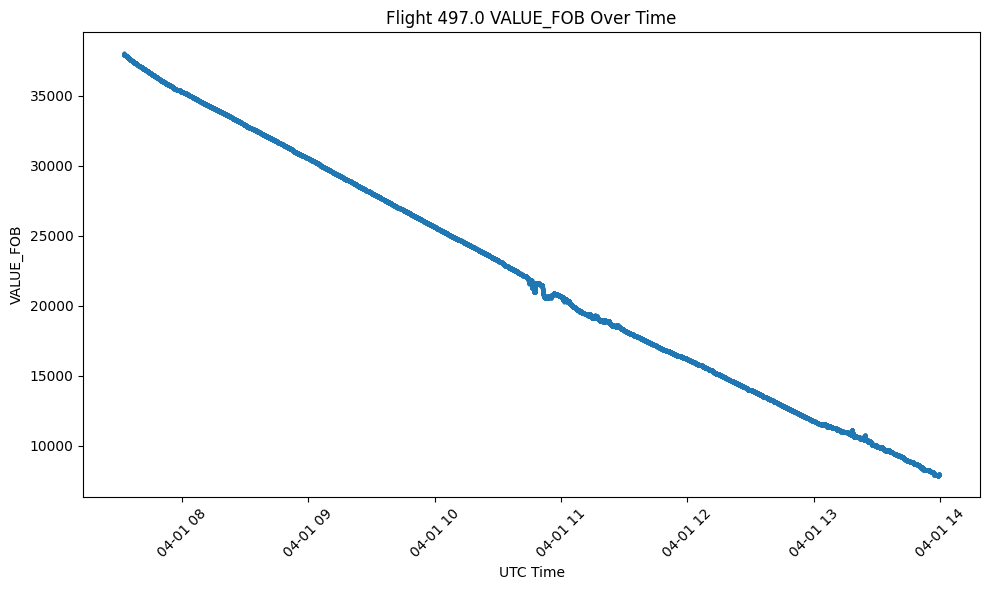

In [14]:
import matplotlib.pyplot as plt

# Assuming 'msn37' DataFrame is already loaded and preprocessed

# Unique flights
flights = msn37['Flight'].unique()

# Plot each flight's VALUE_FOB over time
for flight in flights:
    # Filter data for the current flight
    flight_data = msn37[msn37['Flight'] == flight]
    
    # Create a new figure for each flight
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    
    # Plot VALUE_FOB over UTC_TIME
    plt.plot(flight_data['UTC_TIME'], flight_data['VALUE_FOB'], marker='o', linestyle='-', markersize=2)
    plt.title(f'Flight {flight} VALUE_FOB Over Time')
    plt.xlabel('UTC Time')
    plt.ylabel('VALUE_FOB')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show plot
    plt.show()
